<a href="https://colab.research.google.com/github/Md-Selim-Reza-Concordia-40242313/INSE6220/blob/main/Principal_Component_Analysis_and_Diagnosis_Mobile_Network%20data%20throughput.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Principal Component Analysis and Diagnosis of 4G Mobile Data Throughput**

>



**Install Pycaret**

In [1]:
#!pip install pycaret==3.0.0
!pip install pycaret


**Import Libraries**

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [3]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


**Dataset**
The Mobile data throughput in LTE network is to improved for customer requirements as well as business enhancement for technology upgradation introducing new modulation MIMO for higher bit rate in downlink data transfer. There are many parameters to look up for throughput upgradation and often radio frequency engineers become confused which parameters or data to be considered for efficient and quick optimizaiton of user data throughput enhancement. I have collected most common parameters from a live mobile network dump to analyse PCA and locating the maximum contributor for data throughput.
The column "Thrpt_Good?" is used for classificaiton of the raw data. 0 means the data throughput is not good and exactly lower than 25Mbps and 1 means data throughput is good but still can be improved and more than 25Mbps.

**0 represents Benign and 1 represents Malignant.**


All attributes are numerical and they are listed bellow:

1. within 1000ms, average Reference Signals Received Power = M_RSRP
2. within 1000ms, average Reference Signal Received Quality = M_RSRQ
3. within 1000ms, average Signal to Interference & Noise Ratio = M_SINR
4. within 1000ms, average Channel Quality Indicator = M_CQI
5. within 1000ms, average quadrature phase shift keying = M_QPSK
6. within 1000ms, average 16QAM modulaiton usage = M_16QAM
7. within 1000ms, average 64QAM modulaiton usage = M_64QAM
8. within 1000ms, average 256QAM modulaiton usage = M_256QAM
9. within 1000ms, average multiple-input and multiple-output = M_MIMO
10. within 1000ms, average user data throughput downlink = M_Thrpt_Mbps
11. Thrpt_Good? (Label), is data throughput good?

The original dataset can be found on below link:
https://raw.githubusercontent.com/Md-Selim-Reza-Concordia-40242313/INSE6220/main/LTE_BM25Mbps.csv






In [4]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/Md-Selim-Reza-Concordia-40242313/INSE6220/main/LTE_BM25Mbps.csv')
df.head(25)

,M_RSRP,M_RSRQ,M_SINR,M_CQI,M_QPSK,M_16QAM,M_64QAM,M_256QAM,M_MIMO,M_Thrpt_Mbps,Thrpt_Good?
0,-97.538281,-9.381130,9.365768,7.512178,0.584337,0.301204,0.114457,0.000000,0.271061,36.137517,1
1,-105.280307,-10.846732,1.531255,5.333066,0.904761,0.095238,0.000000,0.000000,0.255737,31.386212,1
2,-108.823946,-12.639569,-1.492985,2.727599,0.850000,0.150000,0.000000,0.000000,0.000000,14.990044,0
3,-91.996087,-8.864064,13.614690,8.619344,0.136645,0.596273,0.192546,0.074534,0.326088,62.057268,1
4,-90.294097,-9.102272,16.697326,11.234322,0.036842,0.321052,0.642105,0.000000,0.429822,95.891242,1
5,-93.199133,-8.340839,12.803632,11.174055,0.454545,0.090909,0.454545,0.000000,0.537283,25.708239,1
6,-100.708889,-13.912408,-3.415459,3.144930,0.935483,0.064516,0.000000,0.000000,0.000000,7.539789,0
7,-105.883773,-11.493229,0.265979,6.253589,0.466101,0.483050,0.050847,0.000000,0.000000,34.824946,1
8,-100.642571,-8.091259,6.917603,6.415762,0.531250,0.437500,0.031250,0.000000,0.458131,24.411513,0
9,-76.964712,-6.921859,22.563281,13.249457,0.000000,0.000000,0.666666,0.333333,0.333333,30.177776,1


In [5]:
len(df.index)

2343

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2343 entries, 0 to 2342
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   M_RSRP        2343 non-null   float64
 1   M_RSRQ        2343 non-null   float64
 2   M_SINR        2343 non-null   float64
 3   M_CQI         2343 non-null   float64
 4   M_QPSK        2343 non-null   float64
 5   M_16QAM       2343 non-null   float64
 6   M_64QAM       2343 non-null   float64
 7   M_256QAM      2343 non-null   float64
 8   M_MIMO        2343 non-null   float64
 9   M_Thrpt_Mbps  2343 non-null   float64
 10  Thrpt_Good?   2343 non-null   int64  
dtypes: float64(10), int64(1)
memory usage: 201.5 KB


In [7]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [8]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

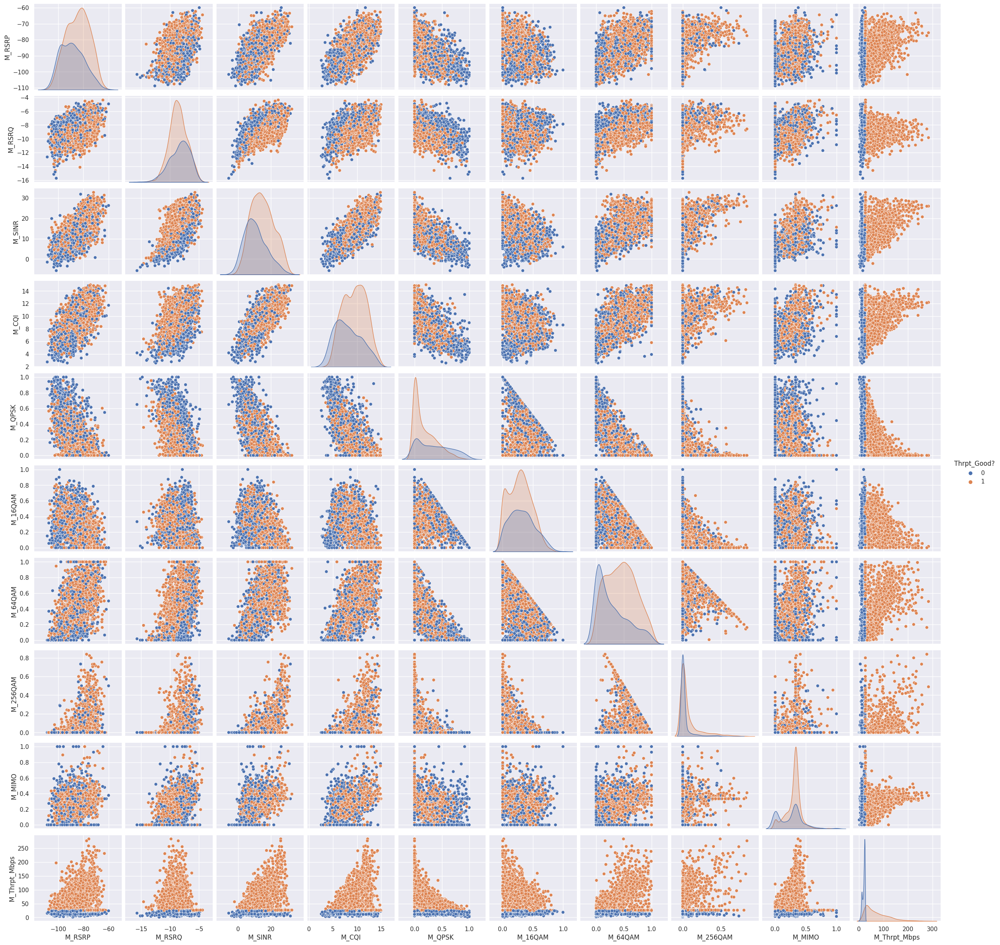

In [9]:
sns.pairplot(df, hue='Thrpt_Good?')
plt.show()

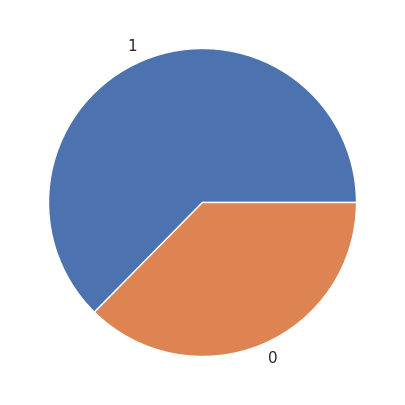

In [10]:
y =df['Thrpt_Good?']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [11]:
X = df.drop(columns=['Thrpt_Good?'])
X.head(10)

,M_RSRP,M_RSRQ,M_SINR,M_CQI,M_QPSK,M_16QAM,M_64QAM,M_256QAM,M_MIMO,M_Thrpt_Mbps
0,-97.538281,-9.381130,9.365768,7.512178,0.584337,0.301204,0.114457,0.000000,0.271061,36.137517
1,-105.280307,-10.846732,1.531255,5.333066,0.904761,0.095238,0.000000,0.000000,0.255737,31.386212
2,-108.823946,-12.639569,-1.492985,2.727599,0.850000,0.150000,0.000000,0.000000,0.000000,14.990044
3,-91.996087,-8.864064,13.614690,8.619344,0.136645,0.596273,0.192546,0.074534,0.326088,62.057268
4,-90.294097,-9.102272,16.697326,11.234322,0.036842,0.321052,0.642105,0.000000,0.429822,95.891242
5,-93.199133,-8.340839,12.803632,11.174055,0.454545,0.090909,0.454545,0.000000,0.537283,25.708239
6,-100.708889,-13.912408,-3.415459,3.144930,0.935483,0.064516,0.000000,0.000000,0.000000,7.539789
7,-105.883773,-11.493229,0.265979,6.253589,0.466101,0.483050,0.050847,0.000000,0.000000,34.824946
8,-100.642571,-8.091259,6.917603,6.415762,0.531250,0.437500,0.031250,0.000000,0.458131,24.411513
9,-76.964712,-6.921859,22.563281,13.249457,0.000000,0.000000,0.666666,0.333333,0.333333,30.177776


In [12]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
M_RSRP,2343.0,-86.067640,9.538594,-108.823946,-93.398917,-86.109179,-78.987391,-59.953982
M_RSRQ,2343.0,-8.522446,1.643865,-15.726713,-9.599226,-8.484244,-7.351532,-4.379514
M_SINR,2343.0,13.257496,7.162168,-5.671896,7.868061,12.631944,18.218825,32.720962
M_CQI,2343.0,8.971608,2.616717,2.558923,6.891596,8.964065,11.052398,15.000000
M_QPSK,2343.0,0.249531,0.257629,0.000000,0.011363,0.171597,0.419354,1.000000
M_16QAM,2343.0,0.299982,0.196020,0.000000,0.142857,0.291666,0.436877,1.000000
M_64QAM,2343.0,0.390861,0.283118,0.000000,0.133333,0.366666,0.611111,1.000000
M_256QAM,2343.0,0.059625,0.129327,0.000000,0.000000,0.000000,0.053343,0.838709
M_MIMO,2343.0,0.280113,0.157451,0.000000,0.192366,0.333333,0.345442,1.000000
M_Thrpt_Mbps,2343.0,52.191034,45.914913,0.778285,22.674132,26.946933,72.162518,283.999744


**Standardize the Data**

In [13]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,M_RSRP,M_RSRQ,M_SINR,M_CQI,M_QPSK,M_16QAM,M_64QAM,M_256QAM,M_MIMO,M_Thrpt_Mbps
0,-1.202807,-0.522468,-0.543489,-0.557852,1.299847,0.006238,-0.976494,-0.461142,-0.057505,-0.349711
1,-2.014633,-1.414217,-1.637597,-1.390796,2.543857,-1.044727,-1.380853,-0.461142,-0.154854,-0.453214
2,-2.386218,-2.505073,-2.059939,-2.386709,2.331254,-0.765298,-1.380853,-0.461142,-1.779435,-0.810389
3,-0.621655,-0.207858,0.049883,-0.134649,-0.438266,1.511861,-0.700617,0.115302,0.292056,0.214927
4,-0.443185,-0.352796,0.480380,0.864900,-0.825739,0.107515,0.887606,-0.461142,0.951031,0.951968
5,-0.747806,0.110499,-0.063383,0.841863,0.795945,-1.066816,0.224985,-0.461142,1.633682,-0.576903
6,-1.535276,-3.279535,-2.328417,-2.227188,2.663132,-1.201490,-1.380853,-0.461142,-1.779435,-0.972686
7,-2.077913,-1.807580,-1.814296,-1.038935,0.840810,0.934128,-1.201218,-0.461142,-1.779435,-0.378304
8,-1.528322,0.262357,-0.885381,-0.976946,1.093743,0.701704,-1.270452,-0.461142,1.130867,-0.605151
9,0.954530,0.973881,1.299575,1.635165,-0.968774,-1.530690,0.974376,2.116848,0.338082,-0.479538


In [14]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
M_RSRP,2343.0,3.790774e-16,1.000213,-2.386218,-0.768755,-0.004356,0.742432,2.738269
M_RSRQ,2343.0,2.971967e-16,1.000213,-4.383453,-0.655169,0.023244,0.712445,2.520777
M_SINR,2343.0,-6.065239e-17,1.000213,-2.643534,-0.752647,-0.087360,0.692861,2.718118
M_CQI,2343.0,2.668705e-16,1.000213,-2.451184,-0.795063,-0.002883,0.795361,2.304292
M_QPSK,2343.0,-8.491334e-17,1.000213,-0.968774,-0.924659,-0.302568,0.659320,2.913611
M_16QAM,2343.0,-1.341934e-16,1.000213,-1.530690,-0.801746,-0.042431,0.698527,3.571924
M_64QAM,2343.0,-2.729357e-17,1.000213,-1.380853,-0.909808,-0.085478,0.778109,2.151995
M_256QAM,2343.0,1.061417e-16,1.000213,-0.461142,-0.461142,-0.461142,-0.048592,6.025413
M_MIMO,2343.0,-1.273700e-16,1.000213,-1.779435,-0.557419,0.338082,0.415002,4.573116
M_Thrpt_Mbps,2343.0,1.789245e-16,1.000213,-1.119979,-0.642998,-0.549919,0.435060,5.049736


**Observations and variables**

In [15]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

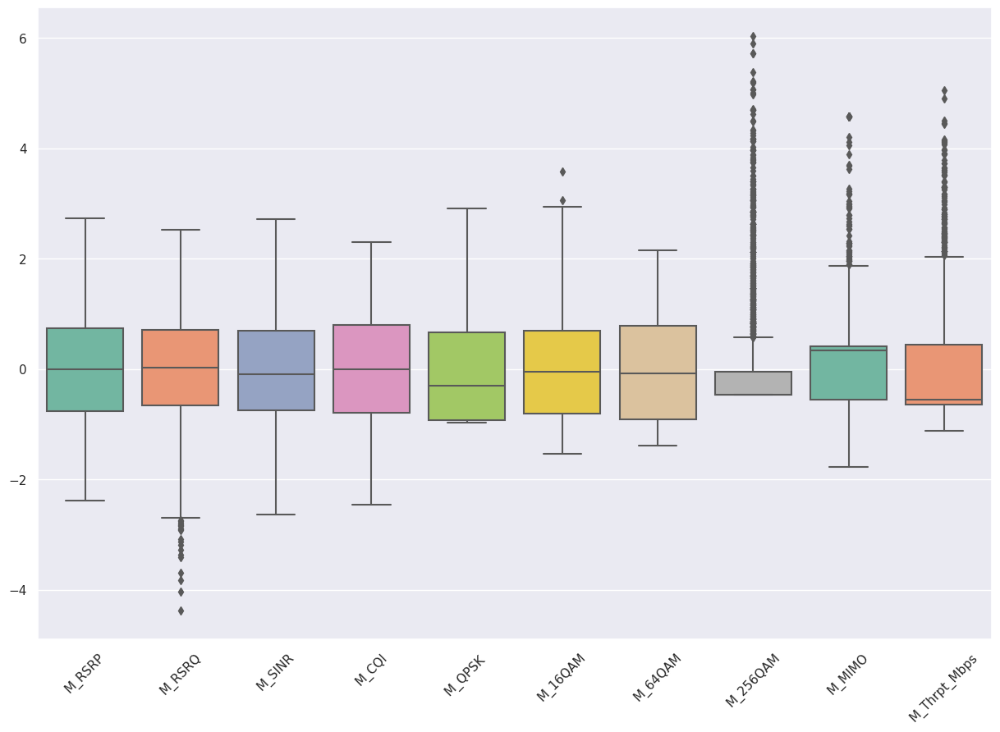

In [16]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:.25'` for same effect.
  warnings.warn(msg, FutureWarning)


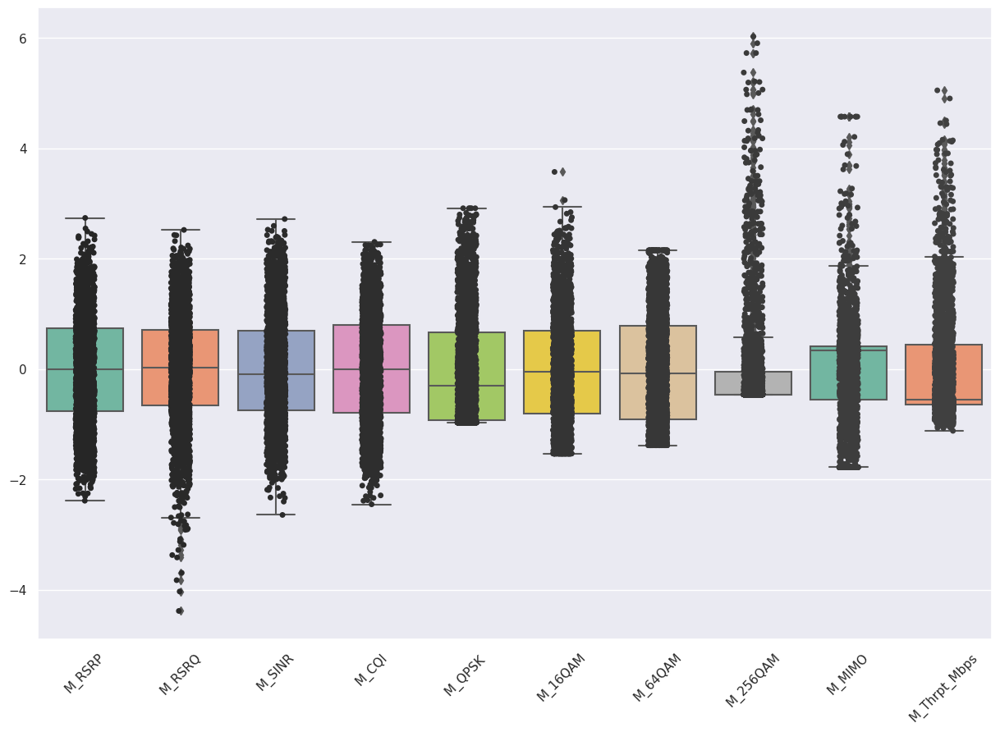

In [17]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()

ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

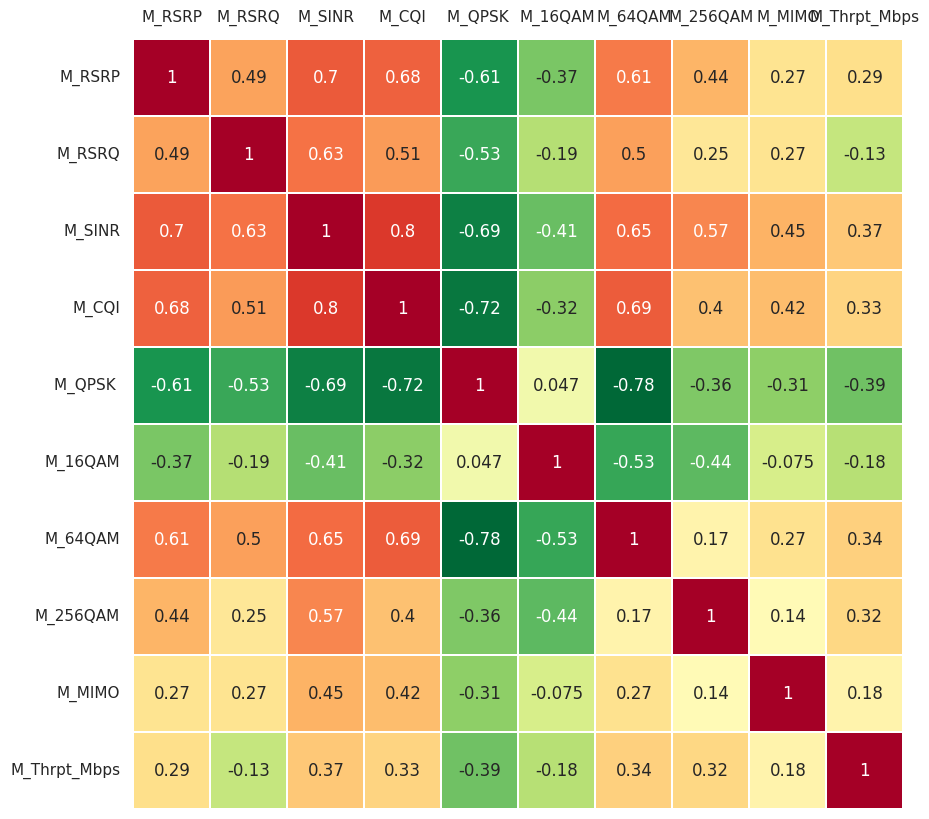

In [18]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

# **Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

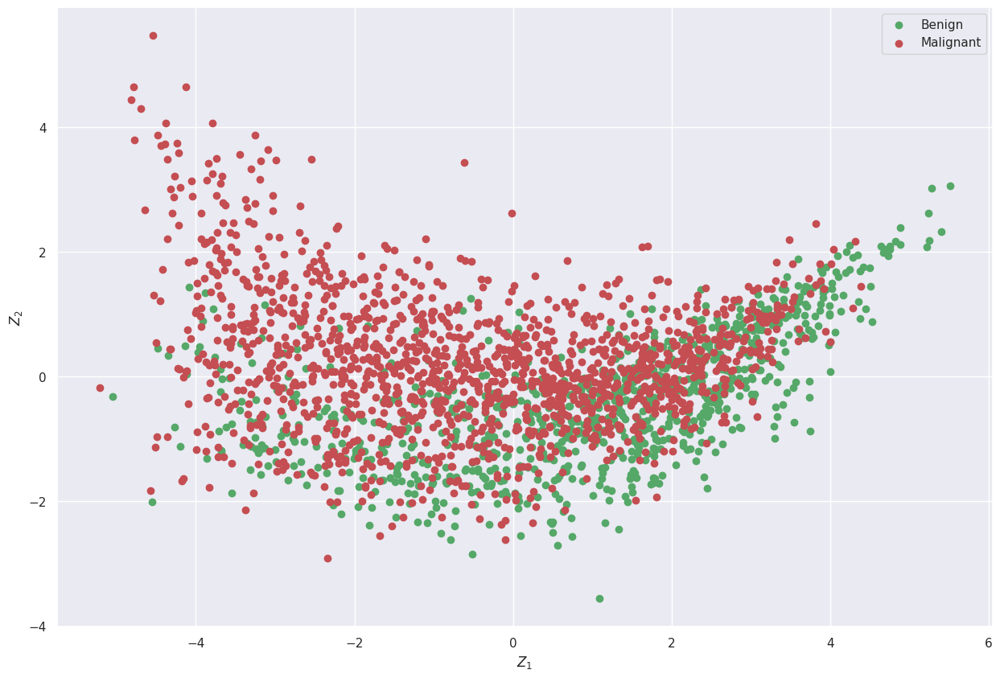

In [19]:
pca = PCA()
Z = pca.fit_transform(X)

# (Malignant)->1,  (Benign)->0

idx_Benign= np.where(y == 0)
idx_Malignant = np.where(y == 1)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='Benign')
plt.scatter(Z[idx_Malignant,0], Z[idx_Malignant,1], c='r', label='Malignant')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

array([[-3.63066253e-01,  7.07833009e-03, -8.45804012e-02,
        -6.57876120e-02, -1.50270862e-01,  8.30126588e-01,
        -2.57620179e-01,  2.79959074e-01,  1.46361046e-02,
        -1.31406502e-07],
       [-2.88986242e-01, -4.68500890e-01, -3.57714667e-01,
         5.66027335e-02, -1.51810231e-01, -3.35312694e-01,
        -5.48818502e-01, -6.83953031e-02,  3.52802494e-01,
         2.06328012e-07],
       [-4.10713999e-01, -6.23195288e-03, -3.48905713e-02,
         1.71939554e-01, -7.80339172e-02, -8.82994399e-02,
        -1.31103483e-01, -3.61539219e-01, -7.99193217e-01,
        -1.35584689e-07],
       [-3.92113452e-01, -9.17318472e-02,  8.18243537e-02,
        -1.13849868e-02,  6.59746056e-03,  1.92316142e-01,
         4.49149376e-01, -6.58380358e-01,  3.98470304e-01,
         9.61797360e-08],
       [ 3.67830674e-01,  2.02417280e-01, -2.84265256e-01,
         2.52144652e-01,  2.48583052e-01,  2.34361281e-01,
        -2.88873463e-01, -3.84508397e-01,  4.72132827e-02,
        -5.

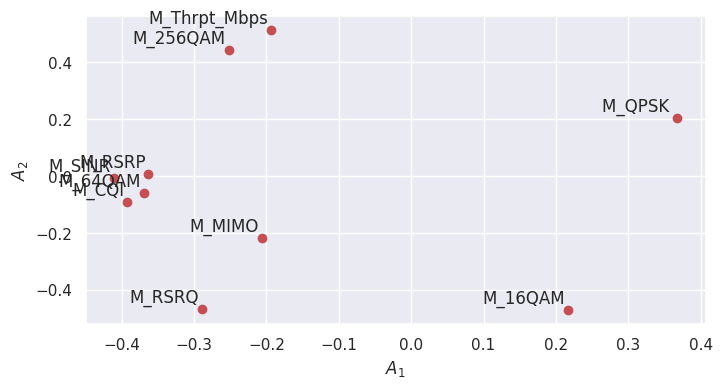

In [20]:
A = pca.components_.T
plt. figure(figsize=(8,4))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:981: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


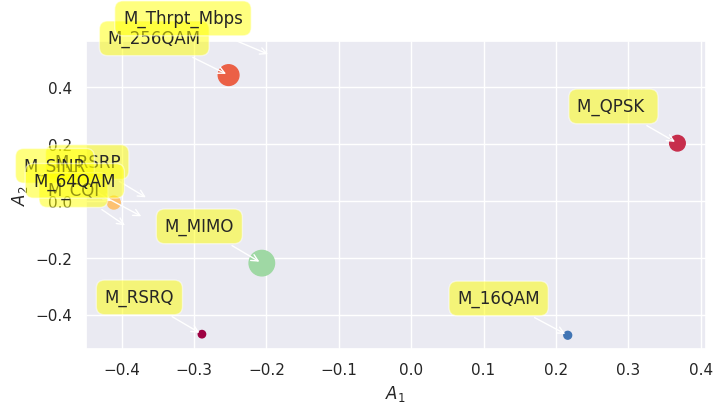

In [21]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

array([4.98726052e+00, 1.23809768e+00, 1.07047216e+00, 8.45459309e-01,
       7.54429051e-01, 3.95803088e-01, 3.08471756e-01, 2.72435309e-01,
       1.31840984e-01, 2.09476098e-12])

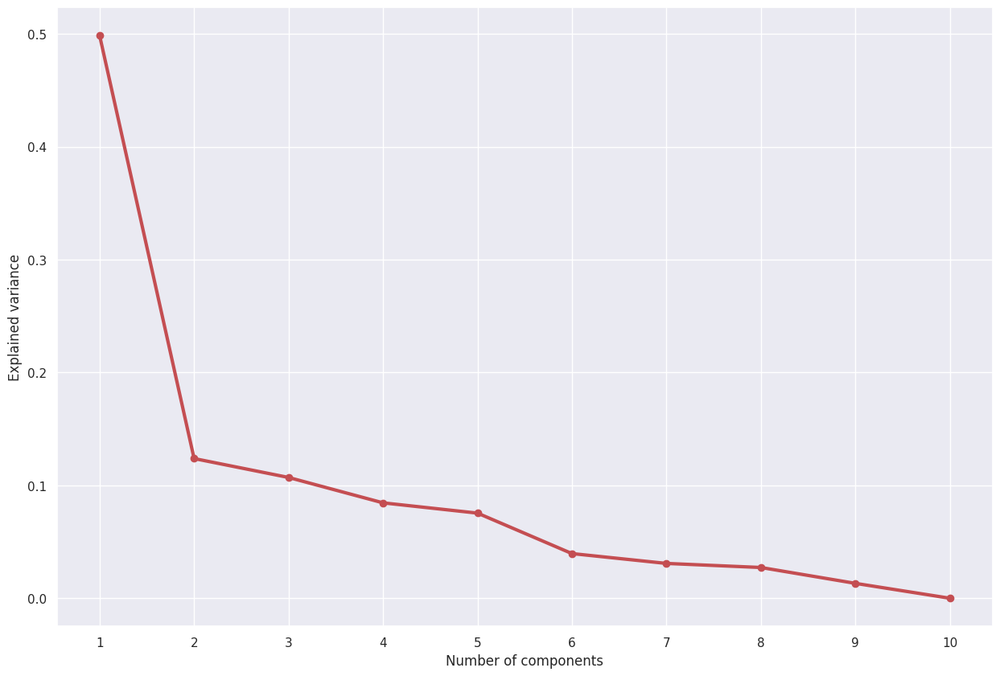

In [22]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

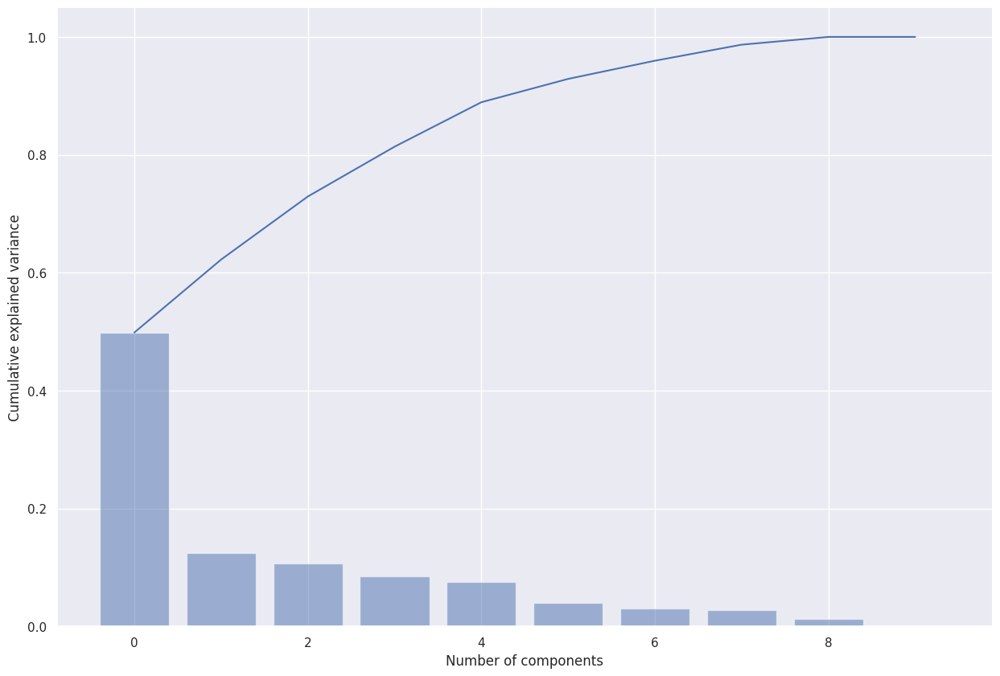

In [23]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([ 0.23863784,  1.47428733,  2.07473232, ...,  0.83517032,
       -1.6233124 , -1.20061869])

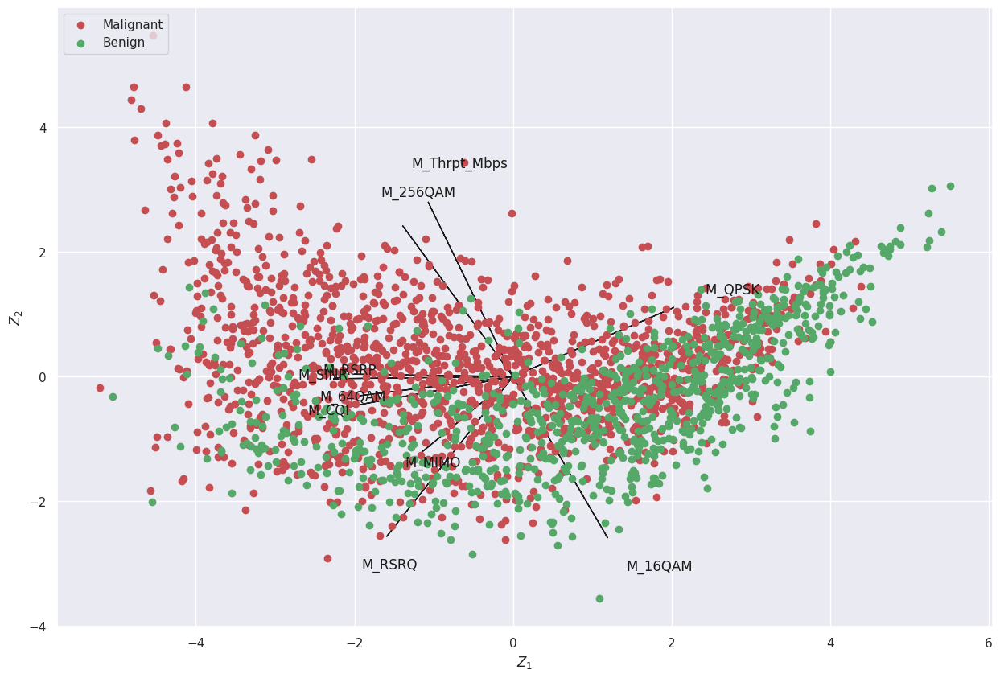

In [24]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Malignant,0], Z[idx_Malignant,1], c='r', label='Malignant')
plt.scatter(Z[idx_Benign,0], Z[idx_Benign,1], c='g', label='Benign')

plt.legend(loc='upper left')
Z1
Z2

# **Using PCA Library**

In [25]:
!pip install pca

In [26]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [10] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [7] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[7]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [27]:
out['PC']

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,2.065714,0.238638,-0.222181,0.560770,0.482200,-0.262799,-0.045550
1,3.813881,1.474287,-0.859771,0.773723,1.458798,-0.405028,0.052473
2,5.214648,2.074732,-1.037449,-0.403103,0.645728,-0.501395,0.575462
3,0.611609,-0.559532,1.253313,0.575621,-0.874385,-0.390964,0.153565
4,-1.146417,-0.115483,1.455615,-0.240129,0.866269,-0.504450,0.429491
...,...,...,...,...,...,...,...
2338,0.590951,-0.591082,-1.274818,-1.227735,-0.848050,0.016172,-0.387265
2339,1.567253,-0.052804,0.095431,1.103155,0.675264,0.073467,-0.259973
2340,-3.388981,0.835170,-0.042141,0.345871,-0.202435,-0.624946,-0.178654
2341,1.553437,-1.623312,0.472107,-1.079637,-2.301070,-0.756029,-0.100385


**Scatter plot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot:title={'center':'7 Principal Components explain [98.68%] of the variance'}, xlabel='PC1 (49.8% expl.var)', ylabel='PC2 (12.3% expl.var)'>)

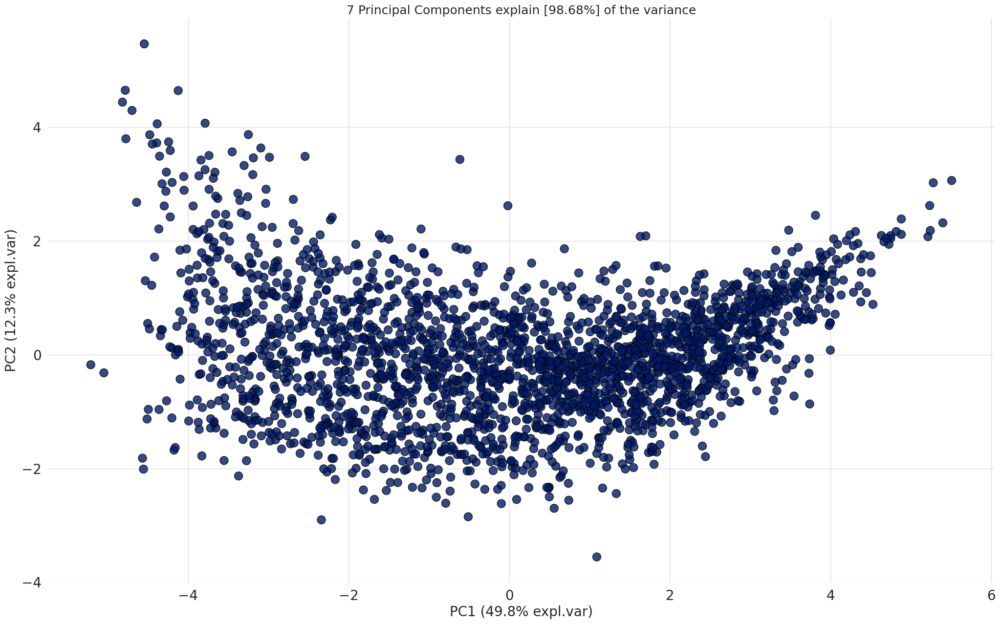

In [28]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [29]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
M_RSRP,-0.363066,0.007078,-0.084580,-0.065788,-0.150271,0.830127,-0.257620
M_RSRQ,-0.288986,-0.468501,-0.357715,0.056603,-0.151810,-0.335313,-0.548819
M_SINR,-0.410714,-0.006232,-0.034891,0.171940,-0.078034,-0.088299,-0.131103
M_CQI,-0.392113,-0.091732,0.081824,-0.011385,0.006597,0.192316,0.449149
M_QPSK,0.367831,0.202417,-0.284265,0.252145,0.248583,0.234361,-0.288873
M_16QAM,0.216303,-0.472287,0.529467,0.063288,-0.494389,0.076597,0.000037
M_64QAM,-0.369289,-0.058945,-0.019604,-0.476139,0.339767,-0.175927,0.150259
M_256QAM,-0.252158,0.441651,-0.193317,0.444132,-0.489659,-0.197829,0.246460
M_MIMO,-0.206274,-0.218935,0.325642,0.672201,0.535554,0.015188,0.011250
M_Thrpt_Mbps,-0.194004,0.511383,0.593323,-0.139203,-0.000418,-0.150211,-0.496600


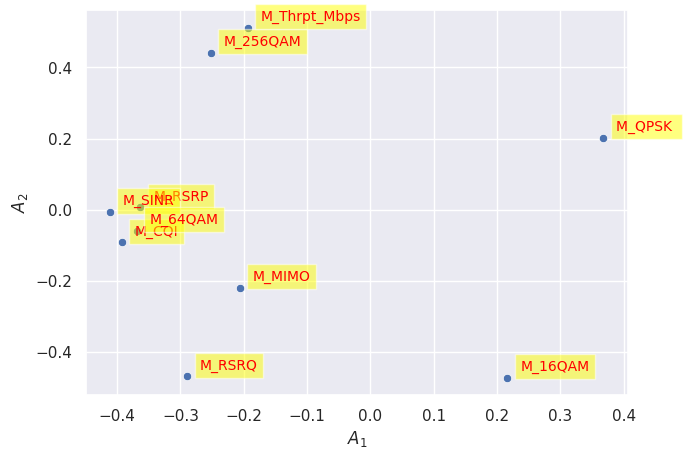

In [30]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))


**Scree Plot**

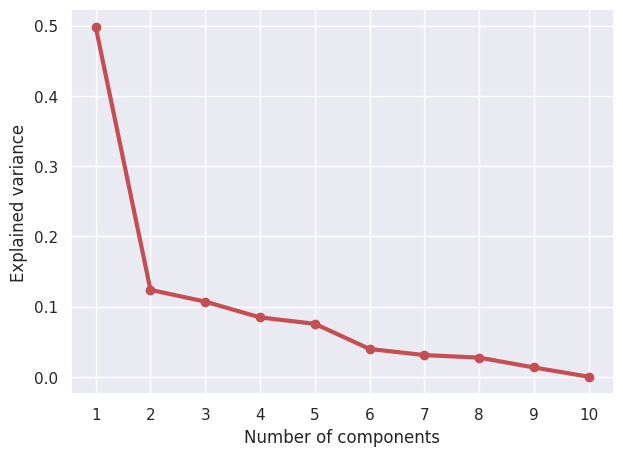

In [31]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

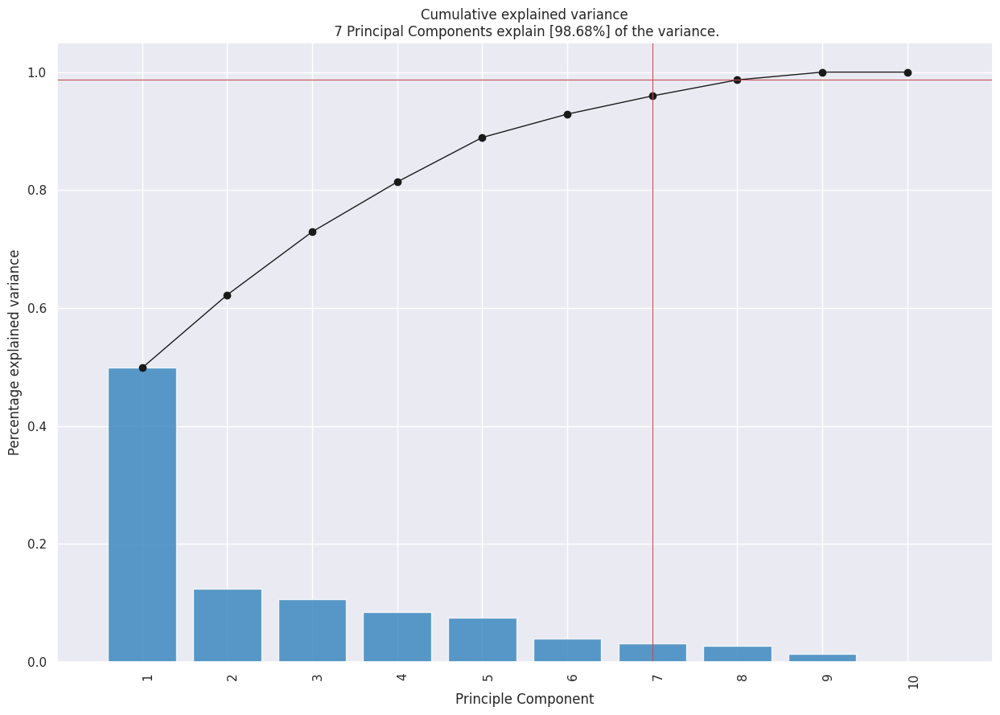

In [32]:
model.plot();

**Biplot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot:title={'center':'7 Principal Components explain [98.68%] of the variance'}, xlabel='PC1 (49.8% expl.var)', ylabel='PC2 (12.3% expl.var)'>)

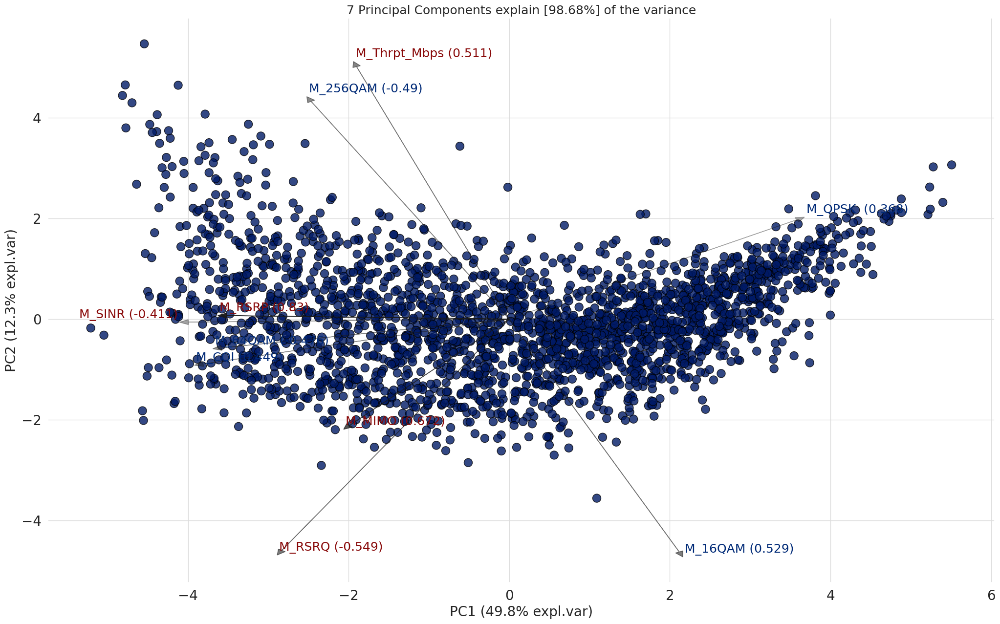

In [33]:
model.biplot(label=False, legend=False, color_arrow='k')

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


[scatterd] >INFO> Create scatterplot


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3DSubplot:title={'center':'7 Principal Components explain [98.68%] of the variance'}, xlabel='PC1 (49.8% expl.var)', ylabel='PC2 (12.3% expl.var)'>)

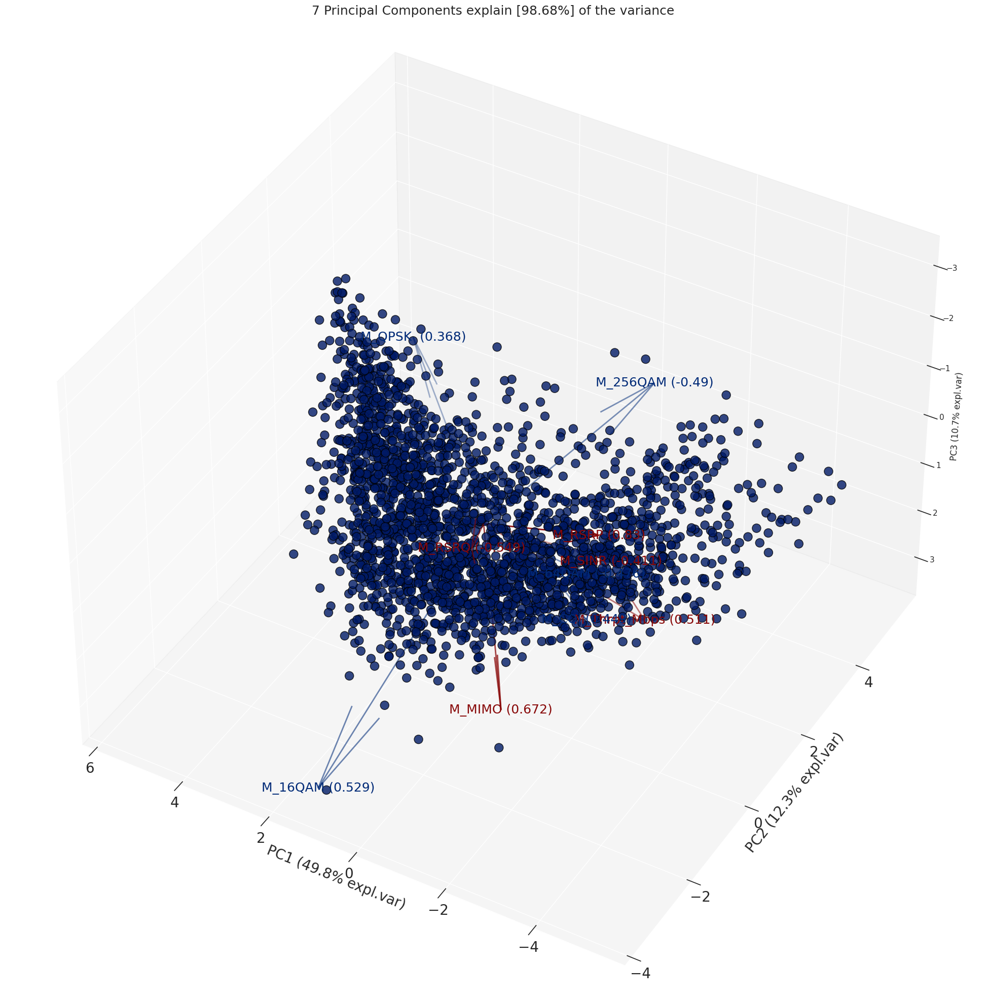

In [34]:
model.biplot3d(legend=False)

# Classification using Pycaret
At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found.
Before applying PCA, the output from compare_models() function shows that Linear Discriminant Analayis, Extra Trees Classifier, and Gradient Boosting Classifier shows the best performance.

 However, after applying PCA, the these models performance decreases and Logistic Regression, K-nearest neighbour, and Quadratic Discriminant Analysis shows the highest performance. Therefore, I have taken Logistic Regression, K-nearest Neighbour and Quadratic discriminant Analysis as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA.

In [35]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'3.0.0'

In [36]:
#For Google Colab only
#!pip install --pre pycaret
###!pip install pycaret
#from pycaret.utils import enable_colab
#from pycaret.classification import *
#enable_colab()
def enable_colab():
  """Enables PyCaret for use in Google Colab.

  This function must be called before any PyCaret models are created or trained.

  Args:
    None

  Returns:
    None
  """

  # Import the PyCaret utils module
  from pycaret.utils import _colab

  # Enable PyCaret for use in Colab
  _colab.enable()

In [37]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (2109, 11)
Unseen Data For Predictions: (234, 11)


In [38]:
from pycaret.classification import *
clf = setup(data=data, target='Thrpt_Good?', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,Thrpt_Good?
2,Target type,Binary
3,Original data shape,"(2109, 11)"
4,Transformed data shape,"(2109, 11)"
5,Transformed train set shape,"(1476, 11)"
6,Transformed test set shape,"(633, 11)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


**Comparing All Models**

In [39]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dt,Decision Tree Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.2440
rf,Random Forest Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.4830
ada,Ada Boost Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.1510
gbc,Gradient Boosting Classifier,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.3130
lightgbm,Light Gradient Boosting Machine,0.9986,1.0000,0.9989,0.9989,0.9989,0.9971,0.9971,0.1780
xgboost,Extreme Gradient Boosting,0.9980,1.0000,1.0000,0.9968,0.9984,0.9956,0.9957,0.1610
lr,Logistic Regression,0.9966,1.0000,0.9978,0.9968,0.9973,0.9928,0.9928,1.7450
et,Extra Trees Classifier,0.9594,0.9935,0.9621,0.9730,0.9674,0.9135,0.9140,0.3190
knn,K Neighbors Classifier,0.9458,0.9868,0.9599,0.9544,0.9569,0.8839,0.8847,0.4970
svm,SVM - Linear Kernel,0.9139,0.0000,0.9402,0.9309,0.9312,0.8147,0.8277,0.2200


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [40]:
best_model

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       random_state=123, splitter='best')

 Create a Model

**Logistic Regresssion**

In [41]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9932,1.0000,0.9891,1.0000,0.9945,0.9857,0.9858
4,0.9932,1.0000,1.0000,0.9892,0.9946,0.9856,0.9857
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9864,0.9998,0.9891,0.9891,0.9891,0.9709,0.9709
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,0.9932,1.0000,1.0000,0.9892,0.9946,0.9854,0.9855


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune the model**

In [42]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
2,0.9932,1.0000,0.9891,1.0000,0.9945,0.9857,0.9858
3,0.9932,1.0000,0.9891,1.0000,0.9945,0.9857,0.9858
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9932,0.9998,0.9891,1.0000,0.9945,0.9855,0.9856
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [43]:
tuned_lr

LogisticRegression(C=8.866, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Evaluate Logistic Regression**


In [44]:
!pip install "schemdraw<0.16"
evaluate_model(tuned_lr)
#evaluate_model(tuned_lr, plot=False)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with K-nearest neighbour**

In [45]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9324,0.9807,0.9462,0.9462,0.9462,0.8553,0.8553
1,0.9189,0.9682,0.9677,0.9091,0.9375,0.8224,0.8257
2,0.9459,0.9869,0.9457,0.9667,0.9560,0.8859,0.8863
3,0.9459,0.9927,0.9457,0.9667,0.9560,0.8859,0.8863
4,0.9662,0.9938,0.9891,0.9579,0.9733,0.9274,0.9283
5,0.9527,0.9939,0.9674,0.9570,0.9622,0.8991,0.8992
6,0.9660,0.9860,0.9674,0.9780,0.9727,0.9276,0.9277
7,0.9184,0.9786,0.9565,0.9167,0.9362,0.8231,0.8245
8,0.9524,0.9928,0.9674,0.9570,0.9622,0.8979,0.8980


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune model with K-nearest neighbour**

In [46]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9324,0.9908,0.9462,0.9462,0.9462,0.8553,0.8553
1,0.9392,0.9879,0.9892,0.9200,0.9534,0.8663,0.8710
2,0.9459,0.9940,0.9348,0.9773,0.9556,0.8867,0.8881
3,0.9797,0.9969,0.9783,0.9890,0.9836,0.9571,0.9572
4,0.9595,0.9953,0.9783,0.9574,0.9677,0.9132,0.9136
5,0.9595,0.9986,1.0000,0.9388,0.9684,0.9120,0.9155
6,0.9592,0.9933,0.9783,0.9574,0.9677,0.9122,0.9126
7,0.9320,0.9909,0.9565,0.9362,0.9462,0.8537,0.8540
8,0.9660,0.9964,0.9891,0.9579,0.9733,0.9266,0.9275


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [47]:
tuned_knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')

**Evaluate model with K-nearest neighbour**

In [48]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with Quadratic Discriminant Analysis**

In [49]:
qda=create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8446,0.9210,0.8172,0.9268,0.8686,0.6803,0.6884
1,0.8378,0.9294,0.8172,0.9157,0.8636,0.6652,0.6718
2,0.8446,0.9245,0.7935,0.9481,0.8639,0.6861,0.7009
3,0.8649,0.9286,0.8370,0.9390,0.8851,0.7224,0.7295
4,0.8446,0.9367,0.7826,0.9600,0.8623,0.6882,0.7072
5,0.8784,0.9573,0.8370,0.9625,0.8953,0.7519,0.7624
6,0.8503,0.9142,0.8043,0.9487,0.8706,0.6960,0.7094
7,0.8912,0.9684,0.8478,0.9750,0.9070,0.7774,0.7884
8,0.8707,0.9302,0.8696,0.9195,0.8939,0.7290,0.7308


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune QDA Model**

In [50]:
tuned_qda=tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9189,0.9758,0.9032,0.9655,0.9333,0.8302,0.8332
1,0.9257,0.9828,0.9355,0.9457,0.9405,0.8414,0.8415
2,0.8784,0.9767,0.8478,0.9512,0.8966,0.7502,0.7575
3,0.9324,0.9839,0.9239,0.9659,0.9444,0.8583,0.8597
4,0.8851,0.9682,0.8804,0.9310,0.9050,0.7600,0.7619
5,0.9392,0.9868,0.9130,0.9882,0.9492,0.8738,0.8781
6,0.8844,0.9644,0.8804,0.9310,0.9050,0.7575,0.7594
7,0.9184,0.9777,0.9022,0.9651,0.9326,0.8294,0.8325
8,0.9048,0.9690,0.9457,0.9062,0.9255,0.7936,0.7950


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


**Evaluate QDA Model**

In [51]:
tuned_qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.96,
                              store_covariance=False, tol=0.0001)

In [52]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [53]:
!pip install statsmodels --upgrade

# **Classification + PCA**

In [54]:
clf_pca = setup(data=data, target='Thrpt_Good?', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,Thrpt_Good?
2,Target type,Binary
3,Original data shape,"(2109, 11)"
4,Transformed data shape,"(2109, 4)"
5,Transformed train set shape,"(1476, 4)"
6,Transformed test set shape,"(633, 4)"
7,Numeric features,10
8,Preprocess,True
9,Imputation type,simple


# **Comparing Models**

In [55]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8157,0.8931,0.8438,0.8593,0.8512,0.6091,0.6099,0.2950
knn,K Neighbors Classifier,0.8035,0.8693,0.8460,0.8409,0.8432,0.5799,0.5805,0.3420
ridge,Ridge Classifier,0.7968,0.0000,0.8308,0.8425,0.8363,0.5680,0.5688,0.5760
lda,Linear Discriminant Analysis,0.7961,0.8816,0.8265,0.8444,0.8352,0.5678,0.5685,0.3040
qda,Quadratic Discriminant Analysis,0.7941,0.8674,0.7408,0.9144,0.8181,0.5864,0.6044,0.3330
et,Extra Trees Classifier,0.7933,0.8823,0.8384,0.8324,0.8351,0.5582,0.5590,0.6690
ada,Ada Boost Classifier,0.7927,0.8701,0.8341,0.8352,0.8342,0.5574,0.5584,0.9290
gbc,Gradient Boosting Classifier,0.7927,0.8878,0.8330,0.8352,0.8339,0.5580,0.5585,0.6320
rf,Random Forest Classifier,0.7879,0.8798,0.8222,0.8361,0.8288,0.5501,0.5509,1.5800
nb,Naive Bayes,0.7846,0.8644,0.8536,0.8125,0.8321,0.5320,0.5344,0.5530


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

# **Best model with PCA**

In [56]:
best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# **Tune Best Model**

In [57]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8176,0.8870,0.8602,0.8511,0.8556,0.6079,0.6080
1,0.7973,0.8831,0.8280,0.8462,0.8370,0.5692,0.5694
2,0.8176,0.9074,0.8478,0.8571,0.8525,0.6135,0.6136
3,0.8243,0.8967,0.8804,0.8438,0.8617,0.6213,0.6223
4,0.8108,0.8958,0.8478,0.8478,0.8478,0.5978,0.5978
5,0.8176,0.8958,0.8478,0.8571,0.8525,0.6135,0.6136
6,0.8027,0.8791,0.8478,0.8387,0.8432,0.5772,0.5773
7,0.8571,0.9265,0.8478,0.9176,0.8814,0.7026,0.7061
8,0.8299,0.9105,0.8696,0.8602,0.8649,0.6355,0.6356


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


# **Evaluate Best Model**

In [58]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [59]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8243,0.8895,0.8602,0.8602,0.8602,0.6239,0.6239
1,0.7973,0.8845,0.8172,0.8539,0.8352,0.5723,0.5733
2,0.8243,0.9061,0.8587,0.8587,0.8587,0.6266,0.6266
3,0.8378,0.9008,0.8804,0.8617,0.8710,0.6529,0.6531
4,0.8041,0.8950,0.8370,0.8462,0.8415,0.5849,0.5850
5,0.8041,0.8969,0.8261,0.8539,0.8398,0.5878,0.5883
6,0.7891,0.8787,0.8261,0.8352,0.8306,0.5513,0.5514
7,0.8571,0.9279,0.8370,0.9277,0.8800,0.7047,0.7104
8,0.8231,0.9132,0.8696,0.8511,0.8602,0.6196,0.6198


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune Model**

In [60]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8176,0.8870,0.8602,0.8511,0.8556,0.6079,0.6080
1,0.7973,0.8831,0.8280,0.8462,0.8370,0.5692,0.5694
2,0.8176,0.9074,0.8478,0.8571,0.8525,0.6135,0.6136
3,0.8243,0.8967,0.8804,0.8438,0.8617,0.6213,0.6223
4,0.8108,0.8958,0.8478,0.8478,0.8478,0.5978,0.5978
5,0.8176,0.8958,0.8478,0.8571,0.8525,0.6135,0.6136
6,0.8027,0.8791,0.8478,0.8387,0.8432,0.5772,0.5773
7,0.8571,0.9265,0.8478,0.9176,0.8814,0.7026,0.7061
8,0.8299,0.9105,0.8696,0.8602,0.8649,0.6355,0.6356


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


# **Evaluate Model**

In [61]:
tuned_lr_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [62]:
evaluate_model(tuned_lr_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Create K-nearest neighbour Model**

In [63]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8378,0.8639,0.8495,0.8876,0.8681,0.6579,0.6589
1,0.8176,0.8745,0.8387,0.8667,0.8525,0.6137,0.6143
2,0.7770,0.8280,0.8370,0.8105,0.8235,0.5210,0.5215
3,0.7973,0.8568,0.8370,0.8370,0.8370,0.5691,0.5691
4,0.7905,0.8839,0.8478,0.8211,0.8342,0.5500,0.5505
5,0.8514,0.9110,0.8913,0.8723,0.8817,0.6818,0.6821
6,0.7619,0.8300,0.8043,0.8132,0.8087,0.4935,0.4935
7,0.8299,0.9014,0.8696,0.8602,0.8649,0.6355,0.6356
8,0.7959,0.8879,0.8696,0.8163,0.8421,0.5545,0.5567


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune Model**

In [64]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8108,0.8706,0.8495,0.8495,0.8495,0.5949,0.5949
1,0.8108,0.8907,0.8495,0.8495,0.8495,0.5949,0.5949
2,0.7770,0.8482,0.8370,0.8105,0.8235,0.5210,0.5215
3,0.8108,0.8659,0.8478,0.8478,0.8478,0.5978,0.5978
4,0.8041,0.8940,0.8370,0.8462,0.8415,0.5849,0.5850
5,0.8514,0.9077,0.9130,0.8571,0.8842,0.6772,0.6799
6,0.7687,0.8356,0.8152,0.8152,0.8152,0.5061,0.5061
7,0.8503,0.9166,0.8804,0.8804,0.8804,0.6804,0.6804
8,0.8367,0.9085,0.9022,0.8469,0.8737,0.6436,0.6461


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [65]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=9, p=2,
                     weights='distance')

# **Evaluate Model KNN**

In [66]:
evaluate_model(tuned_knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# **Create Quadratic Discriminant Analysis Model**

In [67]:
qda_pca = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7770,0.8590,0.7527,0.8750,0.8092,0.5446,0.5536
1,0.7905,0.8585,0.7204,0.9306,0.8121,0.5840,0.6086
2,0.7905,0.8866,0.7174,0.9296,0.8098,0.5852,0.6097
3,0.8041,0.8647,0.7391,0.9315,0.8242,0.6094,0.6304
4,0.7905,0.8610,0.7609,0.8861,0.8187,0.5741,0.5835
5,0.7838,0.8682,0.7283,0.9054,0.8072,0.5676,0.5851
6,0.7755,0.8385,0.7391,0.8831,0.8047,0.5456,0.5576
7,0.8231,0.8982,0.7391,0.9714,0.8395,0.6504,0.6809
8,0.8367,0.8949,0.7717,0.9595,0.8554,0.6729,0.6941


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune model**

In [68]:
tuned_qda_pca = tune_model(qda_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7838,0.8569,0.7527,0.8861,0.8140,0.5599,0.5706
1,0.7703,0.8473,0.7204,0.8933,0.7976,0.5389,0.5558
2,0.7635,0.8766,0.6739,0.9254,0.7799,0.5377,0.5696
3,0.7838,0.8653,0.7065,0.9286,0.8025,0.5732,0.5996
4,0.7838,0.8771,0.7500,0.8846,0.8118,0.5618,0.5724
5,0.7838,0.8721,0.7391,0.8947,0.8095,0.5647,0.5786
6,0.7755,0.8336,0.7391,0.8831,0.8047,0.5456,0.5576
7,0.8163,0.9071,0.7283,0.9710,0.8323,0.6382,0.6709
8,0.7891,0.8731,0.7609,0.8861,0.8187,0.5701,0.5796


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


# **Evaluate Model**

In [69]:
tuned_qda_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [70]:
evaluate_model(tuned_qda_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

# Explainable AI with Shapley values
For binary classification, AI shapley can only support tree based classification models. As none of the the best three models with highest accuracy (LR, KNN, QDA) based on tree, I chose the fourth best model "Extra trees classifier" for the AI Shapley analysis.

In [71]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7973,0.8794,0.8495,0.8316,0.8404,0.5627,0.5630
1,0.7770,0.8795,0.7957,0.8409,0.8177,0.5313,0.5326
2,0.7973,0.8525,0.8696,0.8163,0.8421,0.5599,0.5621
3,0.7973,0.8765,0.8261,0.8444,0.8352,0.5721,0.5723
4,0.7770,0.8986,0.8043,0.8315,0.8177,0.5309,0.5314
5,0.8243,0.9118,0.8478,0.8667,0.8571,0.6291,0.6294
6,0.7551,0.8602,0.8152,0.7979,0.8065,0.4732,0.4734
7,0.8231,0.9147,0.8587,0.8587,0.8587,0.6223,0.6223
8,0.8367,0.9031,0.9022,0.8469,0.8737,0.6436,0.6461


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [72]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7838,0.8792,0.7312,0.9067,0.8095,0.5661,0.5837
1,0.7905,0.8872,0.7097,0.9429,0.8098,0.5868,0.6165
2,0.7703,0.8723,0.7065,0.9028,0.7927,0.5435,0.5643
3,0.7973,0.8826,0.7283,0.9306,0.8171,0.5972,0.6200
4,0.7838,0.9132,0.7283,0.9054,0.8072,0.5676,0.5851
5,0.8108,0.9074,0.7500,0.9324,0.8313,0.6216,0.6409
6,0.7551,0.8532,0.6957,0.8889,0.7805,0.5127,0.5326
7,0.8163,0.9366,0.7500,0.9452,0.8364,0.6333,0.6555
8,0.8367,0.9097,0.7826,0.9474,0.8571,0.6706,0.6874


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [73]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features=1.0, max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0,
                     min_samples_leaf=4, min_samples_split=7,
                     min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

In [74]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [75]:
!pip install shap

"To avoid the error: ModuleNotFoundError: \n'shap' is a soft dependency and not included in the pycaret installation. Please run: `pip install shap` to install.\nAlternately, you can install this by running `pip install pycaret[analysis]`"

In [76]:
import shap

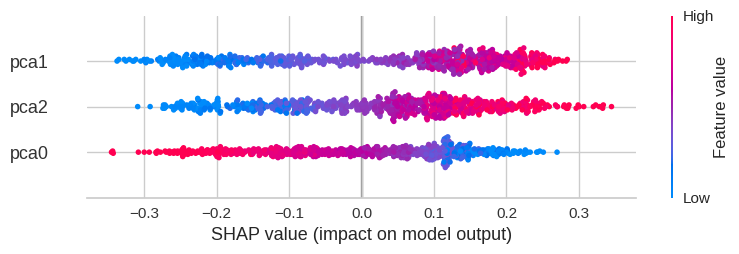

In [77]:
interpret_model(tuned_et_pca, plot='summary')


In [78]:
interpret_model(tuned_et_pca, plot='reason', observation=32)

In [79]:
interpret_model(tuned_et_pca, plot='reason')